<a href="https://colab.research.google.com/github/tran0467/User-behaviour-analysis/blob/main/PCA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

from scipy.stats import kendalltau, pearsonr, spearmanr
import pandas as pd
import numpy as np
from scipy import stats
from scipy.stats import pointbiserialr
import seaborn as sns                       #visualisation
import matplotlib.pyplot as plt             #visualisation
from sklearn.linear_model import LinearRegression
%matplotlib inline     
sns.set(color_codes=True)
%load_ext google.colab.data_table

def kendall_pval(x,y):
  return kendalltau(x,y)[1]
    
def pearsonr_pval(x,y):
  return pearsonr(x,y)[1]
    
def spearmanr_pval(x,y):
  return spearmanr(x,y)[1]

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Enable multiple cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [ ]:
# First-Second value features against First Value Health Profile
pathGeneral = "/content/drive/MyDrive/05. STUDY/FLINDERS/2020-08 Masters Thesis/General_Feature_with_Spent_Time.csv"
dfGeneral = pd.read_csv(pathGeneral)
pathDiffFirstSecond = "/content/drive/MyDrive/05. STUDY/FLINDERS/2020-08 Masters Thesis/Diff_Direction_first_second_value.csv"
dfDiffFirstSecond = pd.read_csv(pathDiffFirstSecond)
pathDiffFirstLast = "/content/drive/MyDrive/05. STUDY/FLINDERS/2020-08 Masters Thesis/Diff_Direction_first_last_value.csv"
dfDiffFirstLast = pd.read_csv(pathDiffFirstLast)

pathProfileFirst = "/content/drive/MyDrive/05. STUDY/FLINDERS/2020-08 Masters Thesis/dfHealthProfile_FirstValue.csv"
dfProfileFirst = pd.read_csv(pathProfileFirst)
pathProfileLast = "/content/drive/MyDrive/05. STUDY/FLINDERS/2020-08 Masters Thesis/dfHealthProfile_LastValue.csv"
dfProfileLast = pd.read_csv(pathProfileLast)

In [ ]:
#Data set dfProfileLast & attribute
dfProfileLast_General = pd.merge(dfProfileLast,dfGeneral, on = 'Visitor_ID', how = 'left')
dfProfileLast_DiffLast = pd.merge(dfProfileLast_General[['Visitor_ID','Gender','Step','Age','Height','Weight','Smoking New',
                                                         'Alcohol New','Trying_Conceive','Trying Month New','Previous_Children',
                                                         'STI_Tested','STI_Positive', 'Menstrual_Information', 'Sex Frequency New',
                                                         'Sex_Right_Time','Contraception','Page Change', 'Steps', 
                                                         'Duration (milliseconds)', 'Completion(%)','Gender Change','Age Change',
                                                         'Height Change','Weight Change','Smoking Change', 'Alcohol Consumption Change',
                                                         'Trying Conceive Change', 'Trying Months Change', 'Previous Children Change', 
                                                         'STI Tested Change', 'STI Positive Change', 'Menstrual Information Change', 
                                                         'Sex Frequency Change', 'Sex Right Time Change','Contraception Change', 
                                                         'AHW time spent', 'Smoking time spent', 'Alcohol time spent', 
                                                         'Conceive time spent','Month time spent', 'Children time spent', 
                                                         'STI_Tested time spent', 'STI_Positive time spent',
                                                         'Menstrual_Information time spent', 'Sex_Frequency time spent', 
                                                         'Sex_Right_Time time spent', 
                                                         'Contraception time spent']],dfDiffFirstSecond[['Visitor_ID','Age Diff',	
                                                          'Height Diff', 'Weight Diff', 'Smoking Diff','Alcohol Diff','Month Diff', 
                                                          'Sex_Frequency Diff','Age Direction','Height Direction',
                                                            'Weight Direction','Smoking Direction','Alcohol Direction',
                                                            'Conceive Direction','Month Direction',
                                                            'Children Direction','STI Direction','STI Positive Direction',
                                                            'Menstrual_Information Direction',
                                                            'Sex_Frequency Direction','Sex_Right_Time Direction',
                                                            'Contraception Direction']], on = 'Visitor_ID', how = 'left')
dfProfileLast_DiffLastandSecond = pd.merge(dfProfileLast_DiffLast,dfDiffFirstLast[['Visitor_ID','Age Diff',	'Height Diff', 'Weight Diff',
                                                      'Smoking Diff','Alcohol Diff','Month Diff', 'Sex_Frequency Diff',
                                                      'Age Direction','Height Direction',
                                                            'Weight Direction','Smoking Direction','Alcohol Direction',
                                                            'Conceive Direction','Month Direction',
                                                            'Children Direction','STI Direction','STI Positive Direction',
                                                            'Menstrual_Information Direction',
                                                            'Sex_Frequency Direction','Sex_Right_Time Direction',
                                                            'Contraception Direction']], on = 'Visitor_ID', how = 'left')


#_x: first & second value; _y: first & last value
display(dfProfileLast_DiffLastandSecond)


,Visitor_ID,Gender,Step,Age,Height,Weight,Smoking New,Alcohol New,Trying_Conceive,Trying Month New,Previous_Children,STI_Tested,STI_Positive,Menstrual_Information,Sex Frequency New,Sex_Right_Time,Contraception,Page Change,Steps,Duration (milliseconds),Completion(%),Gender Change,Age Change,Height Change,Weight Change,Smoking Change,Alcohol Consumption Change,Trying Conceive Change,Trying Months Change,Previous Children Change,STI Tested Change,STI Positive Change,Menstrual Information Change,Sex Frequency Change,Sex Right Time Change,Contraception Change,AHW time spent,Smoking time spent,Alcohol time spent,Conceive time spent,...,Weight Diff_x,Smoking Diff_x,Alcohol Diff_x,Month Diff_x,Sex_Frequency Diff_x,Age Direction_x,Height Direction_x,Weight Direction_x,Smoking Direction_x,Alcohol Direction_x,Conceive Direction_x,Month Direction_x,Children Direction_x,STI Direction_x,STI Positive Direction_x,Menstrual_Information Direction_x,Sex_Frequency Direction_x,Sex_Right_Time Direction_x,Contraception Direction_x,Age Diff_y,Height Diff_y,Weight Diff_y,Smoking Diff_y,Alcohol Diff_y,Month Diff_y,Sex_Frequency Diff_y,Age Direction_y,Height Direction_y,Weight Direction_y,Smoking Direction_y,Alcohol Direction_y,Conceive Direction_y,Month Direction_y,Children Direction_y,STI Direction_y,STI Positive Direction_y,Menstrual_Information Direction_y,Sex_Frequency Direction_y,Sex_Right_Time Direction_y,Contraception Direction_y
0,00052d764372f8e1,Men,1,18,176,86,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2.0,905.0,33.333333,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,905.0,0.0,0.0,NaN,...,0,0.0,0.0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,0,0,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0010038311a193ca,Women,2,26,168,71,0.0,0.0,No,0.0,No,No,NaN,No,5.0,NaN,No,1.0,14.0,150912.0,80.000000,0.0,1.0,1.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,50322.0,...,0,-4.0,0.0,0.0,0.0,1,1,0,-1.0,0.0,-1.0,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,8,6,0,-14.0,0.0,0.0,0.0,1,1,0,-1.0,0.0,-1.0,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0
2,001ad62ea7bffe81,Women,1,23,178,71,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.0,7.0,105123.0,33.333333,0.0,3.0,3.0,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,8401.0,0.0,0.0,-105123.0,...,0,0.0,0.0,0.0,0.0,1,1,0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,5,16,0,0.0,0.0,0.0,0.0,1,1,0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN
3,001f49b0bfe37865,Women,2,25,250,168,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,Yes,No,1.0,14.0,82610.0,60.000000,0.0,1.0,8.0,2.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,0.0,0.0,66170.0,0.0,0.0,16440.0,...,147,0.0,0.0,0.0,0.0,1,-1,1,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,0.0,0.0,7,84,97,0.0,0.0,0.0,0.0,1,1,1,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,0.0,0.0
4,00274a3448b59cbd,Women,2,32,171,81,12.0,0.0,Yes,0.0,Yes,No,NaN,No,20.0,Unsure,No,1.0,15.0,81093.0,86.666667,0.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,8683.0,20312.0,0.0,16558.0,...,10,-2.0,0.0,0.0,0.0,0,1,1,-1.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0,9,10,2.0,0.0,0.0,0.0,0,1,1,1.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4125,ffbbfa8e0095fa45,Women,2,25,160,59,0.0,0.0,No,0.0,No,No,No,No,4.0,Unsure,No,1.0,19.0,208349.0,93.333333,0.0,1.0,2.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,122483.0,0.0,0.0,13823.0,...,-10,0.0,0.0,0.0,-12.0,1,1,-1,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,9,-2,-12,0.0,0.0,0.0,-12.0,1,-1,-1,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0
4126,ffc980a4b6d372c6,Women,2,21,170,63,0.0,0.0,Yes,0.0,No,Yes,No,No,17.0,Unsure,No,1.0,14.0,92606.0,93.333333,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,51568.0,0.0,0.0,12405.0,...,

In [ ]:
dfProfileLast_DiffLastandSecond['Gender']=dfProfileLast_DiffLastandSecond['Gender'].replace(["Men"],1)
dfProfileLast_DiffLastandSecond['Gender']=dfProfileLast_DiffLastandSecond['Gender'].replace(["Women"],0)

dfProfileLast_DiffLastandSecond['Step']=dfProfileLast_DiffLastandSecond['Step'].replace([1],0)
dfProfileLast_DiffLastandSecond['Step']=dfProfileLast_DiffLastandSecond['Step'].replace([2],1)

dfProfileLast_DiffLastandSecond['Trying_Conceive']=dfProfileLast_DiffLastandSecond['Trying_Conceive'].replace(["Yes"],1)
dfProfileLast_DiffLastandSecond['Trying_Conceive']=dfProfileLast_DiffLastandSecond['Trying_Conceive'].replace(["No"],0)

dfProfileLast_DiffLastandSecond['Previous_Children']=dfProfileLast_DiffLastandSecond['Previous_Children'].replace(["Yes"],1)
dfProfileLast_DiffLastandSecond['Previous_Children']=dfProfileLast_DiffLastandSecond['Previous_Children'].replace(["No"],0)

dfProfileLast_DiffLastandSecond['STI_Tested']=dfProfileLast_DiffLastandSecond['STI_Tested'].replace(["Yes"],1)
dfProfileLast_DiffLastandSecond['STI_Tested']=dfProfileLast_DiffLastandSecond['STI_Tested'].replace(["No"],0)

dfProfileLast_DiffLastandSecond['STI_Positive']=dfProfileLast_DiffLastandSecond['STI_Positive'].replace(["Yes"],1)
dfProfileLast_DiffLastandSecond['STI_Positive']=dfProfileLast_DiffLastandSecond['STI_Positive'].replace(["No"],0)

dfProfileLast_DiffLastandSecond['Menstrual_Information']=dfProfileLast_DiffLastandSecond['Menstrual_Information'].replace(["Yes"],1)
dfProfileLast_DiffLastandSecond['Menstrual_Information']=dfProfileLast_DiffLastandSecond['Menstrual_Information'].replace(["No"],0)

dfProfileLast_DiffLastandSecond['Contraception']=dfProfileLast_DiffLastandSecond['Contraception'].replace(["Yes"],1)
dfProfileLast_DiffLastandSecond['Contraception']=dfProfileLast_DiffLastandSecond['Contraception'].replace(["No"],0)

dfProfileLast_DiffLastandSecond['Age Direction_x'] = dfProfileLast_DiffLastandSecond['Age Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Age Direction_x'] = dfProfileLast_DiffLastandSecond['Age Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Age Direction_x'] = dfProfileLast_DiffLastandSecond['Age Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Height Direction_x'] = dfProfileLast_DiffLastandSecond['Height Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Height Direction_x'] = dfProfileLast_DiffLastandSecond['Height Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Height Direction_x'] = dfProfileLast_DiffLastandSecond['Height Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Weight Direction_x'] = dfProfileLast_DiffLastandSecond['Weight Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Weight Direction_x'] = dfProfileLast_DiffLastandSecond['Weight Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Weight Direction_x'] = dfProfileLast_DiffLastandSecond['Weight Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Smoking Direction_x'] = dfProfileLast_DiffLastandSecond['Smoking Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Smoking Direction_x'] = dfProfileLast_DiffLastandSecond['Smoking Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Smoking Direction_x'] = dfProfileLast_DiffLastandSecond['Smoking Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Alcohol Direction_x'] = dfProfileLast_DiffLastandSecond['Alcohol Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Alcohol Direction_x'] = dfProfileLast_DiffLastandSecond['Alcohol Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Alcohol Direction_x'] = dfProfileLast_DiffLastandSecond['Alcohol Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Conceive Direction_x'] = dfProfileLast_DiffLastandSecond['Conceive Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Conceive Direction_x'] = dfProfileLast_DiffLastandSecond['Conceive Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Conceive Direction_x'] = dfProfileLast_DiffLastandSecond['Conceive Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Month Direction_x'] = dfProfileLast_DiffLastandSecond['Month Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Month Direction_x'] = dfProfileLast_DiffLastandSecond['Month Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Month Direction_x'] = dfProfileLast_DiffLastandSecond['Month Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Children Direction_x'] = dfProfileLast_DiffLastandSecond['Children Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Children Direction_x'] = dfProfileLast_DiffLastandSecond['Children Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Children Direction_x'] = dfProfileLast_DiffLastandSecond['Children Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['STI Direction_x'] = dfProfileLast_DiffLastandSecond['STI Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['STI Direction_x'] = dfProfileLast_DiffLastandSecond['STI Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['STI Direction_x'] = dfProfileLast_DiffLastandSecond['STI Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['STI Positive Direction_x'] = dfProfileLast_DiffLastandSecond['STI Positive Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['STI Positive Direction_x'] = dfProfileLast_DiffLastandSecond['STI Positive Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['STI Positive Direction_x'] = dfProfileLast_DiffLastandSecond['STI Positive Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_x'] = dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_x'] = dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_x'] = dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_x'] = dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_x'] = dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_x'] = dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_x'] = dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_x'] = dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_x'] = dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Contraception Direction_x'] = dfProfileLast_DiffLastandSecond['Contraception Direction_x'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Contraception Direction_x'] = dfProfileLast_DiffLastandSecond['Contraception Direction_x'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Contraception Direction_x'] = dfProfileLast_DiffLastandSecond['Contraception Direction_x'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Age Direction_y'] = dfProfileLast_DiffLastandSecond['Age Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Age Direction_y'] = dfProfileLast_DiffLastandSecond['Age Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Age Direction_y'] = dfProfileLast_DiffLastandSecond['Age Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Height Direction_y'] = dfProfileLast_DiffLastandSecond['Height Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Height Direction_y'] = dfProfileLast_DiffLastandSecond['Height Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Height Direction_y'] = dfProfileLast_DiffLastandSecond['Height Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Weight Direction_y'] = dfProfileLast_DiffLastandSecond['Weight Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Weight Direction_y'] = dfProfileLast_DiffLastandSecond['Weight Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Weight Direction_y'] = dfProfileLast_DiffLastandSecond['Weight Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Smoking Direction_y'] = dfProfileLast_DiffLastandSecond['Smoking Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Smoking Direction_y'] = dfProfileLast_DiffLastandSecond['Smoking Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Smoking Direction_y'] = dfProfileLast_DiffLastandSecond['Smoking Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Alcohol Direction_y'] = dfProfileLast_DiffLastandSecond['Alcohol Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Alcohol Direction_y'] = dfProfileLast_DiffLastandSecond['Alcohol Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Alcohol Direction_y'] = dfProfileLast_DiffLastandSecond['Alcohol Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Conceive Direction_y'] = dfProfileLast_DiffLastandSecond['Conceive Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Conceive Direction_y'] = dfProfileLast_DiffLastandSecond['Conceive Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Conceive Direction_y'] = dfProfileLast_DiffLastandSecond['Conceive Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Month Direction_y'] = dfProfileLast_DiffLastandSecond['Month Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Month Direction_y'] = dfProfileLast_DiffLastandSecond['Month Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Month Direction_y'] = dfProfileLast_DiffLastandSecond['Month Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Children Direction_y'] = dfProfileLast_DiffLastandSecond['Children Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Children Direction_y'] = dfProfileLast_DiffLastandSecond['Children Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Children Direction_y'] = dfProfileLast_DiffLastandSecond['Children Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['STI Direction_y'] = dfProfileLast_DiffLastandSecond['STI Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['STI Direction_y'] = dfProfileLast_DiffLastandSecond['STI Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['STI Direction_y'] = dfProfileLast_DiffLastandSecond['STI Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['STI Positive Direction_y'] = dfProfileLast_DiffLastandSecond['STI Positive Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['STI Positive Direction_y'] = dfProfileLast_DiffLastandSecond['STI Positive Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['STI Positive Direction_y'] = dfProfileLast_DiffLastandSecond['STI Positive Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_y'] = dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_y'] = dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_y'] = dfProfileLast_DiffLastandSecond['Menstrual_Information Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_y'] = dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_y'] = dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_y'] = dfProfileLast_DiffLastandSecond['Sex_Frequency Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_y'] = dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_y'] = dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_y'] = dfProfileLast_DiffLastandSecond['Sex_Right_Time Direction_y'].replace(0,"No change")

dfProfileLast_DiffLastandSecond['Contraception Direction_y'] = dfProfileLast_DiffLastandSecond['Contraception Direction_y'].replace([1,0.5],"Positive")
dfProfileLast_DiffLastandSecond['Contraception Direction_y'] = dfProfileLast_DiffLastandSecond['Contraception Direction_y'].replace([-1,-0.5],"Negative")
dfProfileLast_DiffLastandSecond['Contraception Direction_y'] = dfProfileLast_DiffLastandSecond['Contraception Direction_y'].replace(0,"No change")

#dfProfileLast_DiffLastandSecond['Completion(%)']= pd.cut(dfProfileLast_DiffLastandSecond['Completion(%)'], bins = [0,50, 75, 100], labels=['Less than 50%', 'From 50% to 75%', 'Over 75%'])

dummies = pd.get_dummies(dfProfileLast_DiffLastandSecond[['Sex_Right_Time','Age Direction_x',	'Height Direction_x',	'Weight Direction_x',
                                                          'Smoking Direction_x',	'Alcohol Direction_x',	'Conceive Direction_x',
                                                          'Month Direction_x',	'Children Direction_x',	'STI Direction_x',	
                                                          'STI Positive Direction_x',	'Menstrual_Information Direction_x',	
                                                          'Sex_Frequency Direction_x',	'Sex_Right_Time Direction_x',	
                                                          'Contraception Direction_x', 'Age Direction_y',	'Height Direction_y',
                                                          'Weight Direction_y',	'Smoking Direction_y',	
                                                        'Alcohol Direction_y',	'Conceive Direction_y',	
                                                        'Month Direction_y',	'Children Direction_y',	'STI Direction_y',
                                                        	'STI Positive Direction_y',	'Menstrual_Information Direction_y',
                                                          'Sex_Frequency Direction_y',	'Sex_Right_Time Direction_y',
                                                          'Contraception Direction_y']])

dfProfileLast_DiffLastandSecond2 = pd.concat([dfProfileLast_DiffLastandSecond, dummies], axis=1)

dfProfileLast_DiffLastandSecond2.drop(['Sex_Right_Time','Age Direction_x',	'Height Direction_x',	'Weight Direction_x',
                                                          'Smoking Direction_x',	'Alcohol Direction_x',	'Conceive Direction_x',
                                                          'Month Direction_x',	'Children Direction_x',	'STI Direction_x',	
                                                          'STI Positive Direction_x',	'Menstrual_Information Direction_x',	
                                                          'Sex_Frequency Direction_x',	'Sex_Right_Time Direction_x',	
                                                          'Contraception Direction_x', 'Age Direction_y',	'Height Direction_y',
                                                          'Weight Direction_y',	'Smoking Direction_y',	
                                                        'Alcohol Direction_y',	'Conceive Direction_y',	
                                                        'Month Direction_y',	'Children Direction_y',	'STI Direction_y',
                                                        	'STI Positive Direction_y',	'Menstrual_Information Direction_y',
                                                          'Sex_Frequency Direction_y',	'Sex_Right_Time Direction_y',
                                                          'Contraception Direction_y'], axis=1)

dfProfileLast_DiffLastandSecond3 = dfProfileLast_DiffLastandSecond2.loc[dfProfileLast_DiffLastandSecond2['Completion(%)']>50]
dfProfileLast_DiffLastandSecond3

,Visitor_ID,Gender,Step,Age,Height,Weight,Smoking New,Alcohol New,Trying_Conceive,Trying Month New,Previous_Children,STI_Tested,STI_Positive,Menstrual_Information,Sex Frequency New,Contraception,Page Change,Steps,Duration (milliseconds),Completion(%),Gender Change,Age Change,Height Change,Weight Change,Smoking Change,Alcohol Consumption Change,Trying Conceive Change,Trying Months Change,Previous Children Change,STI Tested Change,STI Positive Change,Menstrual Information Change,Sex Frequency Change,Sex Right Time Change,Contraception Change,AHW time spent,Smoking time spent,Alcohol time spent,Conceive time spent,Month time spent,...,Age Direction_y_Positive,Height Direction_y_Negative,Height Direction_y_No change,Height Direction_y_Positive,Weight Direction_y_Negative,Weight Direction_y_No change,Weight Direction_y_Positive,Smoking Direction_y_Negative,Smoking Direction_y_No change,Smoking Direction_y_Positive,Alcohol Direction_y_Negative,Alcohol Direction_y_No change,Alcohol Direction_y_Positive,Conceive Direction_y_Negative,Conceive Direction_y_No change,Conceive Direction_y_Positive,Month Direction_y_Negative,Month Direction_y_No change,Month Direction_y_Positive,Children Direction_y_Negative,Children Direction_y_No change,Children Direction_y_Positive,STI Direction_y_Negative,STI Direction_y_No change,STI Direction_y_Positive,STI Positive Direction_y_Negative,STI Positive Direction_y_No change,STI Positive Direction_y_Positive,Menstrual_Information Direction_y_Negative,Menstrual_Information Direction_y_No change,Menstrual_Information Direction_y_Positive,Sex_Frequency Direction_y_Negative,Sex_Frequency Direction_y_No change,Sex_Frequency Direction_y_Positive,Sex_Right_Time Direction_y_Negative,Sex_Right_Time Direction_y_No change,Sex_Right_Time Direction_y_Positive,Contraception Direction_y_Negative,Contraception Direction_y_No change,Contraception Direction_y_Positive
0,00052d764372f8e1,1,0,18,176,86,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2.0,905.0,33.333333,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,905.0,0.0,0.0,NaN,NaN,...,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0010038311a193ca,0,1,26,168,71,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,5.0,0.0,1.0,14.0,150912.0,80.000000,0.0,1.0,1.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,50322.0,0.0,...,1,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0
2,001ad62ea7bffe81,0,0,23,178,71,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,1.0,7.0,105123.0,33.333333,0.0,3.0,3.0,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,8401.0,0.0,0.0,-105123.0,0.0,...,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,001f49b0bfe37865,0,1,25,250,168,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,0.0,1.0,14.0,82610.0,60.000000,0.0,1.0,8.0,2.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,0.0,0.0,66170.0,0.0,0.0,16440.0,0.0,...,1,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
4,00274a3448b59cbd,0,1,32,171,81,12.0,0.0,1.0,0.0,1.0,0.0,NaN,0.0,20.0,0.0,1.0,15.0,81093.0,86.666667,0.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,8683.0,20312.0,0.0,16558.0,0.0,...,0,0,0,1,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4125,ffbbfa8e0095fa45,0,1,25,160,59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,1.0,19.0,208349.0,93.333333,0.0,1.0,2.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,122483.0,0.0,0.0,13823.0,0.0,...,1,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0
4126,ffc980a4b6d372c6,0,1,21,170,63,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,17.0,0.0,1.0,14.0,92606.0,93.333333,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0

,Visitor_ID,Gender,Step,Age,Height,Weight,Smoking New,Alcohol New,Trying_Conceive,Trying Month New,Previous_Children,STI_Tested,STI_Positive,Menstrual_Information,Sex Frequency New,Sex_Right_Time,Contraception,Page Change,Steps,Duration (milliseconds),Completion(%),Gender Change,Age Change,Height Change,Weight Change,Smoking Change,Alcohol Consumption Change,Trying Conceive Change,Trying Months Change,Previous Children Change,STI Tested Change,STI Positive Change,Menstrual Information Change,Sex Frequency Change,Sex Right Time Change,Contraception Change,AHW time spent,Smoking time spent,Alcohol time spent,Conceive time spent,...,Age Direction_y_Positive,Height Direction_y_Negative,Height Direction_y_No change,Height Direction_y_Positive,Weight Direction_y_Negative,Weight Direction_y_No change,Weight Direction_y_Positive,Smoking Direction_y_Negative,Smoking Direction_y_No change,Smoking Direction_y_Positive,Alcohol Direction_y_Negative,Alcohol Direction_y_No change,Alcohol Direction_y_Positive,Conceive Direction_y_Negative,Conceive Direction_y_No change,Conceive Direction_y_Positive,Month Direction_y_Negative,Month Direction_y_No change,Month Direction_y_Positive,Children Direction_y_Negative,Children Direction_y_No change,Children Direction_y_Positive,STI Direction_y_Negative,STI Direction_y_No change,STI Direction_y_Positive,STI Positive Direction_y_Negative,STI Positive Direction_y_No change,STI Positive Direction_y_Positive,Menstrual_Information Direction_y_Negative,Menstrual_Information Direction_y_No change,Menstrual_Information Direction_y_Positive,Sex_Frequency Direction_y_Negative,Sex_Frequency Direction_y_No change,Sex_Frequency Direction_y_Positive,Sex_Right_Time Direction_y_Negative,Sex_Right_Time Direction_y_No change,Sex_Right_Time Direction_y_Positive,Contraception Direction_y_Negative,Contraception Direction_y_No change,Contraception Direction_y_Positive
1,0010038311a193ca,0,1,26,168,71,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,5.0,NaN,0.0,1.0,14.0,150912.0,80.000000,0.0,1.0,1.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,50322.0,...,1,0,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0
3,001f49b0bfe37865,0,1,25,250,168,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,Yes,0.0,1.0,14.0,82610.0,60.000000,0.0,1.0,8.0,2.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,0.0,0.0,66170.0,0.0,0.0,16440.0,...,1,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
4,00274a3448b59cbd,0,1,32,171,81,12.0,0.0,1.0,0.0,1.0,0.0,NaN,0.0,20.0,Unsure,0.0,1.0,15.0,81093.0,86.666667,0.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,8683.0,20312.0,0.0,16558.0,...,0,0,0,1,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0
5,003f72c154cb8bc0,1,1,40,165,83,0.0,8.0,NaN,0.0,NaN,NaN,NaN,NaN,4.0,No,0.0,1.0,14.0,99209.0,60.000000,0.0,5.0,1.0,2.0,0.0,1.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,0.0,0.0,44645.0,0.0,15979.0,38585.0,...,1,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
6,004cae2702ee4b5b,0,1,38,173,68,0.0,1.0,1.0,10.0,1.0,0.0,NaN,0.0,5.0,Yes,0.0,1.0,12.0,78627.0,86.666667,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,34270.0,0.0,17159.0,4326.0,...,0,0,0,1,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4124,ffb8cb55766e9f15,0,1,29,162,53,0.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,4.0,Yes,0.0,1.0,22.0,259652.0,93.333333,0.0,1.0,0.0,3.0,2.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,54746.0,0.0,0.0,20522.0,...,1,0,1,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0
4125,ffbbfa8e0095fa45,0,1,25,160,59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,Unsure,0.0,1.0,19.0,208349.0,93.333333,0.0,1.0,2

In [ ]:
#Selected variables
from sklearn.preprocessing import StandardScaler
#features = ['Gender',	'Step',	'Age',	'Height',	'Weight',	'Smoking New',	'Alcohol New',	'Trying_Conceive',	'Trying Month New',
#            'Previous_Children',	'STI_Tested',	'STI_Positive',	'Menstrual_Information',	'Sex Frequency New',	
#            'Contraception',	'Sex_Right_Time_Yes','Sex_Right_Time_No','Sex_Right_Time_Unsure',]
# Separating out the features
#x1 = dfProfileLast_DiffLastandSecond3.loc[:, features].values
x1 = dfProfileLast_DiffLastandSecond3[[
                                       'Gender',	'Step',	'Age',	'Height',	'Weight',	'Smoking New',	'Alcohol New',	'Trying_Conceive',	'Trying Month New',
            'Previous_Children',	'STI_Tested',	'STI_Positive',	'Menstrual_Information',	'Sex Frequency New',	
            'Contraception',	'Sex_Right_Time_Yes','Sex_Right_Time_No','Sex_Right_Time_Unsure',

            # 'Page Change',	'Steps',	'Duration (milliseconds)',	'Completion(%)',
            # 'Gender Change',	'Age Change',	'Height Change',	'Weight Change',	'Smoking Change',	'Alcohol Consumption Change',
            # 'Trying Conceive Change',	'Trying Months Change',	'Previous Children Change',	'STI Tested Change',
            # 'STI Positive Change',	'Menstrual Information Change',	'Sex Frequency Change',	'Sex Right Time Change',	
            # 'Contraception Change',	'AHW time spent',	'Smoking time spent',	'Alcohol time spent',	'Conceive time spent',
            # 'Month time spent', 'Children time spent', 'STI_Tested time spent', 'STI_Positive time spent',
            # 'Menstrual_Information time spent', 'Sex_Frequency time spent', 'Sex_Right_Time time spent', 'Contraception time spent',
            
            # 'Age Diff_x',	'Height Diff_x', 'Weight Diff_x', 'Smoking Diff_x','Alcohol Diff_x','Month Diff_x', 'Sex_Frequency Diff_x',
            # 'Age Diff_y',	'Height Diff_y', 'Weight Diff_y', 'Smoking Diff_y','Alcohol Diff_y','Month Diff_y', 'Sex_Frequency Diff_y',
            
            # 'Age Direction_x_No change','Age Direction_x_Negative','Age Direction_x_Positive',	'Height Direction_x_Negative',	
            # 'Height Direction_x_No change',	'Height Direction_x_Positive',	'Weight Direction_x_Negative',	
            # 'Weight Direction_x_No change',	'Weight Direction_x_Positive',	'Smoking Direction_x_Negative',	
            # 'Smoking Direction_x_No change',	'Smoking Direction_x_Positive',	'Alcohol Direction_x_Negative',	
            # 'Alcohol Direction_x_No change',	'Alcohol Direction_x_Positive',	'Conceive Direction_x_Negative',	
            # 'Conceive Direction_x_No change',	'Conceive Direction_x_Positive',	'Month Direction_x_Negative',
            # 'Month Direction_x_No change',	'Month Direction_x_Positive',	'Children Direction_x_Negative',	
            # 'Children Direction_x_No change',	'Children Direction_x_Positive',	'STI Direction_x_Negative',	
            # 'STI Direction_x_No change',	'STI Direction_x_Positive',	'STI Positive Direction_x_Negative',	
            # 'STI Positive Direction_x_No change',	'STI Positive Direction_x_Positive',	'Menstrual_Information Direction_x_Negative',
            # 'Menstrual_Information Direction_x_No change',	'Menstrual_Information Direction_x_Positive',	
            # 'Sex_Frequency Direction_x_Negative',	'Sex_Frequency Direction_x_No change',	'Sex_Frequency Direction_x_Positive',
            # 'Sex_Right_Time Direction_x_Negative',	'Sex_Right_Time Direction_x_No change',	'Sex_Right_Time Direction_x_Positive',
            # 'Contraception Direction_x_Negative',	'Contraception Direction_x_No change',	'Contraception Direction_x_Positive',
            
            # 'Age Direction_y_No change','Age Direction_y_Negative','Age Direction_y_Positive',	'Height Direction_y_Negative',	
            # 'Height Direction_y_No change',	'Height Direction_y_Positive',	'Weight Direction_y_Negative',	
            # 'Weight Direction_y_No change',	'Weight Direction_y_Positive',	'Smoking Direction_y_Negative',	
            # 'Smoking Direction_y_No change',	'Smoking Direction_y_Positive',	'Alcohol Direction_y_Negative',	
            # 'Alcohol Direction_y_No change',	'Alcohol Direction_y_Positive',	'Conceive Direction_y_Negative',	
            # 'Conceive Direction_y_No change',	'Conceive Direction_y_Positive',	'Month Direction_y_Negative',
            # 'Month Direction_y_No change',	'Month Direction_y_Positive',	'Children Direction_y_Negative',	
            # 'Children Direction_y_No change',	'Children Direction_y_Positive',	'STI Direction_y_Negative',	
            # 'STI Direction_y_No change',	'STI Direction_y_Positive',	'STI Positive Direction_y_Negative',	
            # 'STI Positive Direction_y_No change',	'STI Positive Direction_y_Positive',	'Menstrual_Information Direction_y_Negative',
            # 'Menstrual_Information Direction_y_No change',	'Menstrual_Information Direction_y_Positive',	
            # 'Sex_Frequency Direction_y_Negative',	'Sex_Frequency Direction_y_No change',	'Sex_Frequency Direction_y_Positive',
            # 'Sex_Right_Time Direction_y_Negative',	'Sex_Right_Time Direction_y_No change',	'Sex_Right_Time Direction_y_Positive',
            # 'Contraception Direction_y_Negative',	'Contraception Direction_y_No change',	'Contraception Direction_y_Positive'
            ]]

x1.fillna(x1.mean(), inplace=True)
#display(x1)
# Standardizing the features
x = StandardScaler().fit_transform(x1)
standard = pd.DataFrame(data = x
             , columns = [
                          'Gender',	'Step',	'Age',	'Height',	'Weight',	'Smoking New',	'Alcohol New',	'Trying_Conceive',	'Trying Month New',
            'Previous_Children',	'STI_Tested',	'STI_Positive',	'Menstrual_Information',	'Sex Frequency New',	
            'Contraception',	'Sex_Right_Time_Yes','Sex_Right_Time_No','Sex_Right_Time_Unsure',

            # 'Page Change',	'Steps',	'Duration (milliseconds)',	'Completion(%)',
            # 'Gender Change',	'Age Change',	'Height Change',	'Weight Change',	'Smoking Change',	'Alcohol Consumption Change',
            # 'Trying Conceive Change',	'Trying Months Change',	'Previous Children Change',	'STI Tested Change',
            # 'STI Positive Change',	'Menstrual Information Change',	'Sex Frequency Change',	'Sex Right Time Change',	
            # 'Contraception Change',	'AHW time spent',	'Smoking time spent',	'Alcohol time spent',	'Conceive time spent',
            # 'Month time spent', 'Children time spent', 'STI_Tested time spent', 'STI_Positive time spent',
            # 'Menstrual_Information time spent', 'Sex_Frequency time spent', 'Sex_Right_Time time spent', 'Contraception time spent',
            
            # 'Age Diff_x',	'Height Diff_x', 'Weight Diff_x', 'Smoking Diff_x','Alcohol Diff_x','Month Diff_x', 'Sex_Frequency Diff_x',
            # 'Age Diff_y',	'Height Diff_y', 'Weight Diff_y', 'Smoking Diff_y','Alcohol Diff_y','Month Diff_y', 'Sex_Frequency Diff_y',
            
            # 'Age Direction_x_No change','Age Direction_x_Negative','Age Direction_x_Positive',	'Height Direction_x_Negative',	
            # 'Height Direction_x_No change',	'Height Direction_x_Positive',	'Weight Direction_x_Negative',	
            # 'Weight Direction_x_No change',	'Weight Direction_x_Positive',	'Smoking Direction_x_Negative',	
            # 'Smoking Direction_x_No change',	'Smoking Direction_x_Positive',	'Alcohol Direction_x_Negative',	
            # 'Alcohol Direction_x_No change',	'Alcohol Direction_x_Positive',	'Conceive Direction_x_Negative',	
            # 'Conceive Direction_x_No change',	'Conceive Direction_x_Positive',	'Month Direction_x_Negative',
            # 'Month Direction_x_No change',	'Month Direction_x_Positive',	'Children Direction_x_Negative',	
            # 'Children Direction_x_No change',	'Children Direction_x_Positive',	'STI Direction_x_Negative',	
            # 'STI Direction_x_No change',	'STI Direction_x_Positive',	'STI Positive Direction_x_Negative',	
            # 'STI Positive Direction_x_No change',	'STI Positive Direction_x_Positive',	'Menstrual_Information Direction_x_Negative',
            # 'Menstrual_Information Direction_x_No change',	'Menstrual_Information Direction_x_Positive',	
            # 'Sex_Frequency Direction_x_Negative',	'Sex_Frequency Direction_x_No change',	'Sex_Frequency Direction_x_Positive',
            # 'Sex_Right_Time Direction_x_Negative',	'Sex_Right_Time Direction_x_No change',	'Sex_Right_Time Direction_x_Positive',
            # 'Contraception Direction_x_Negative',	'Contraception Direction_x_No change',	'Contraception Direction_x_Positive',
            
            # 'Age Direction_y_No change','Age Direction_y_Negative','Age Direction_y_Positive',	'Height Direction_y_Negative',	
            # 'Height Direction_y_No change',	'Height Direction_y_Positive',	'Weight Direction_y_Negative',	
            # 'Weight Direction_y_No change',	'Weight Direction_y_Positive',	'Smoking Direction_y_Negative',	
            # 'Smoking Direction_y_No change',	'Smoking Direction_y_Positive',	'Alcohol Direction_y_Negative',	
            # 'Alcohol Direction_y_No change',	'Alcohol Direction_y_Positive',	'Conceive Direction_y_Negative',	
            # 'Conceive Direction_y_No change',	'Conceive Direction_y_Positive',	'Month Direction_y_Negative',
            # 'Month Direction_y_No change',	'Month Direction_y_Positive',	'Children Direction_y_Negative',	
            # 'Children Direction_y_No change',	'Children Direction_y_Positive',	'STI Direction_y_Negative',	
            # 'STI Direction_y_No change',	'STI Direction_y_Positive',	'STI Positive Direction_y_Negative',	
            # 'STI Positive Direction_y_No change',	'STI Positive Direction_y_Positive',	'Menstrual_Information Direction_y_Negative',
            # 'Menstrual_Information Direction_y_No change',	'Menstrual_Information Direction_y_Positive',	
            # 'Sex_Frequency Direction_y_Negative',	'Sex_Frequency Direction_y_No change',	'Sex_Frequency Direction_y_Positive',
            # 'Sex_Right_Time Direction_y_Negative',	'Sex_Right_Time Direction_y_No change',	'Sex_Right_Time Direction_y_Positive',
            # 'Contraception Direction_y_Negative',	'Contraception Direction_y_No change',	'Contraception Direction_y_Positive'
            ])
display(standard)

# from google.colab import drive
# drive.mount('drive')
# standard.to_csv('standard.csv')
# !cp standard.csv "/content/drive/MyDrive/05. STUDY/FLINDERS/2020-08 Masters Thesis/"

,Gender,Step,Age,Height,Weight,Smoking New,Alcohol New,Trying_Conceive,Trying Month New,Previous_Children,STI_Tested,STI_Positive,Menstrual_Information,Sex Frequency New,Contraception,Sex_Right_Time_Yes,Sex_Right_Time_No,Sex_Right_Time_Unsure
0,-0.358449,0.0,-0.784521,0.208776,-0.141456,-0.301657,-0.473498,-1.577072e+00,-0.549048,-6.981713e-01,-1.518829,7.193320e-17,-3.805511e-01,-0.487653,-0.336911,-0.859328,-0.443263,-0.786076
1,-0.358449,0.0,-0.925783,6.845319,3.428443,-0.301657,-0.473498,2.481384e-16,-0.549048,1.200715e-16,0.000000,7.193320e-17,4.665343e-17,-1.188277,-0.336911,1.163700,-0.443263,-0.786076
2,-0.358449,0.0,0.063053,0.451577,0.226574,3.314834,-0.473498,6.579598e-01,-0.549048,1.464845e+00,-1.518829,7.193320e-17,-3.805511e-01,1.614218,-0.336911,-0.859328,-0.443263,1.272142
3,2.789797,0.0,1.193152,-0.034024,0.300181,-0.301657,1.543521,2.481384e-16,-0.549048,1.200715e-16,0.000000,7.193320e-17,4.665343e-17,-0.627778,-0.336911,-0.859328,2.255997,-0.786076
4,-0.358449,0.0,0.910627,0.613444,-0.251866,-0.301657,-0.221371,6.579598e-01,1.300590,1.464845e+00,-1.518829,7.193320e-17,-3.805511e-01,-0.487653,-0.336911,1.163700,-0.443263,-0.786076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192,-0.358449,0.0,-0.360734,-0.276824,-0.803912,-0.301657,-0.473498,6.579598e-01,0.190807,-6.981713e-01,0.666955,-2.882171e-01,-3.805511e-01,-0.627778,-0.336911,1.163700,-0.443263,-0.786076
3193,-0.358449,0.0,-0.925783,-0.438691,-0.583093,-0.301657,-0.473498,-1.577072e+00,-0.549048,-6.981713e-01,-1.518829,-2.882171e-01,-3.805511e-01,-0.627778,-0.336911,-0.859328,-0.443263,1.272142
3194,-0.358449,0.0,-1.490833,0.370643,-0.435881,-0.301657,-0.473498,6.579598e-01,-0.549048,-6.981713e-01,0.666955,-2.882171e-01,-3.805511e-01,1.193843,-0.336911,-0.859328,-0.443263,1.272142
3195,-0.358449,0.0,0.628103,0.775311,-0.546290,-0.301657,0.787139,6.579598e-01,2.780301,-6.981713e-01,0.666955,-2.882171e-01,-3.805511e-01,-0.767903,-0.336911,-0.859328,-0.443263,1.272142


Drive already mounted at drive; to attempt to forcibly remount, call drive.mount("drive", force_remount=True).


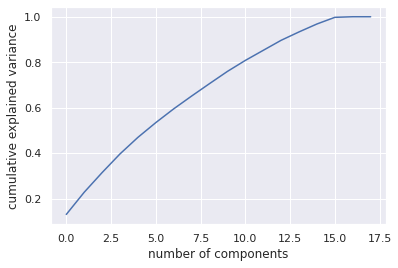

In [ ]:
from sklearn.decomposition import PCA
#standard.fillna(standard.mean(), inplace=True)


pca = PCA().fit(standard)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [ ]:

from sklearn.decomposition import PCA
pca = PCA(n_components=10)
principalComponents = pca.fit_transform(x)
#display(principalComponents)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['pc1', 'pc2', 'pc3','pc4','pc5','pc6'
            ,'pc7','pc8','pc9','pc10',
            # 'pc11', 'pc12', 'pc13','pc14','pc15','pc16',
            # 'pc17','pc18','pc19','pc20',
             ])

principalDf

# from google.colab import drive
# drive.mount('drive')
# principalDf.to_csv('PCA3.csv')
# !cp PCA3.csv "/content/drive/MyDrive/05. STUDY/FLINDERS/2020-08 Masters Thesis/"




,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10
0,1.339193,-0.831672,0.528995,-0.397253,0.600181,-0.485181,-0.566986,-0.832573,-0.331831,0.747777
1,-1.079752,3.552843,3.077366,-0.555355,0.782445,-1.697724,1.897007,-1.685383,-2.674982,-0.794786
2,-0.209313,1.645136,-1.734804,0.275787,-1.098731,1.090660,-0.284447,-1.776363,0.474932,2.852186
3,0.784985,1.371607,2.393204,1.869861,0.945510,0.348340,-0.660000,0.529487,0.513498,-0.340255
4,-1.790768,-0.167979,0.016583,1.235470,0.482502,-0.845799,-1.125810,0.312028,-0.376853,0.887820
...,...,...,...,...,...,...,...,...,...,...
3192,-1.212052,-1.411143,0.199815,-0.476210,0.302190,-0.163589,-0.038151,-0.107324,0.258530,-0.866730
3193,2.096849,-0.670599,-0.846196,-0.729440,0.441661,-0.777163,-0.983888,-0.842091,0.168135,0.590885
3194,0.329224,-0.006020,-1.192115,-1.763322,-0.021642,-0.153622,0.387976,-0.937402,0.134363,-0.702300
3195,-0.295373,1.180530,-1.440930,0.205907,1.169738,0.069350,-0.639155,0.614595,1.201327,-2.135816


Drive already mounted at drive; to attempt to forcibly remount, call drive.mount("drive", force_remount=True).


Text(0.5, 0, 'pc1')

Text(0, 0.5, 'pc2')

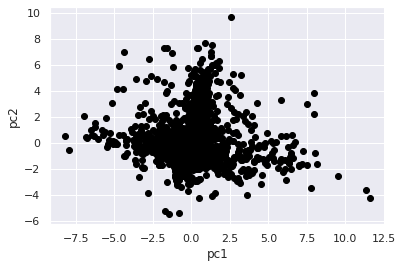

Text(0.5, 0, 'pc1')

Text(0, 0.5, 'pc3')

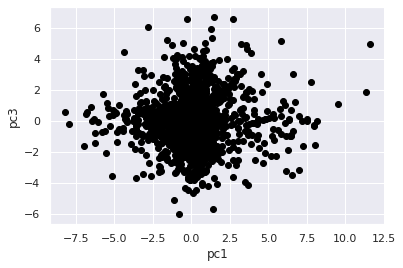

Text(0.5, 0, 'pc1')

Text(0, 0.5, 'pc4')

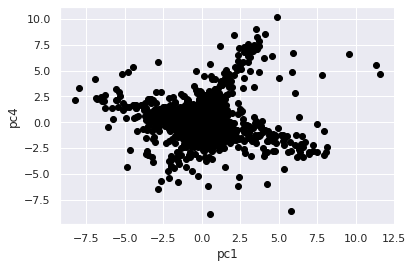

Text(0.5, 0, 'pc1')

Text(0, 0.5, 'pc5')

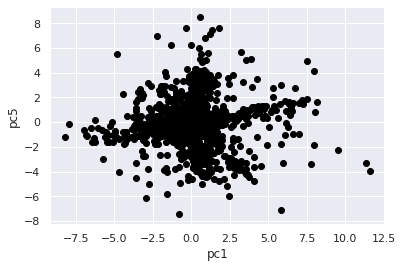

Text(0.5, 0, 'pc1')

Text(0, 0.5, 'pc6')

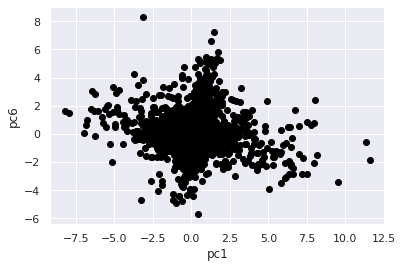

Text(0.5, 0, 'pc2')

Text(0, 0.5, 'pc3')

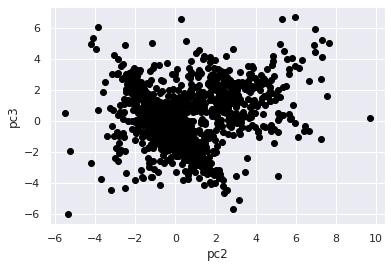

Text(0.5, 0, 'pc2')

Text(0, 0.5, 'pc4')

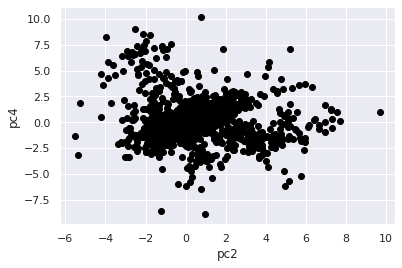

Text(0.5, 0, 'pc2')

Text(0, 0.5, 'pc5')

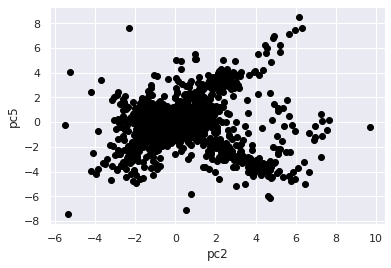

Text(0.5, 0, 'pc2')

Text(0, 0.5, 'pc6')

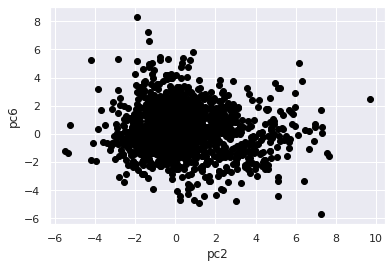

Text(0.5, 0, 'pc3')

Text(0, 0.5, 'pc4')

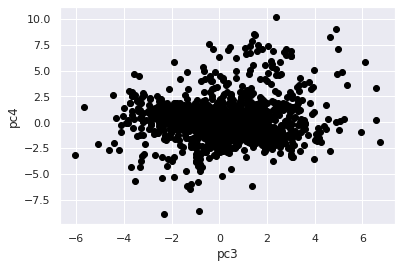

Text(0.5, 0, 'pc3')

Text(0, 0.5, 'pc5')

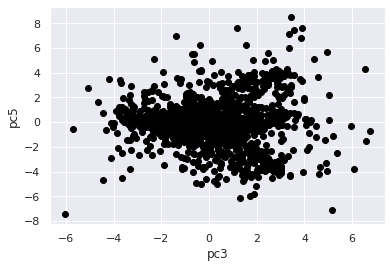

Text(0.5, 0, 'pc3')

Text(0, 0.5, 'pc6')

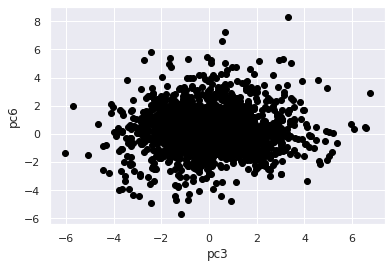

Text(0.5, 0, 'pc4')

Text(0, 0.5, 'pc5')

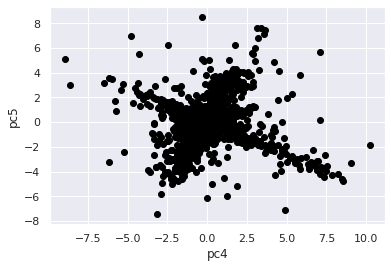

Text(0.5, 0, 'pc4')

Text(0, 0.5, 'pc6')

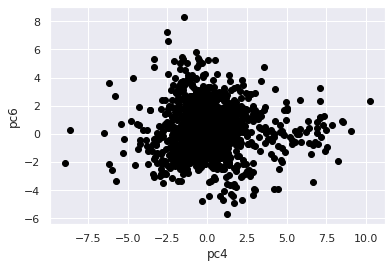

Text(0.5, 0, 'pc5')

Text(0, 0.5, 'pc6')

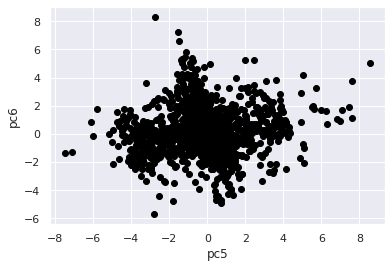

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.cluster import KMeans

#Visualise data points
plt.scatter(principalDf['pc1'],principalDf['pc2'],c='black')
plt.xlabel('pc1')
plt.ylabel('pc2')
plt.show()

plt.scatter(principalDf['pc1'],principalDf['pc3'],c='black')
plt.xlabel('pc1')
plt.ylabel('pc3')
plt.show()

plt.scatter(principalDf['pc1'],principalDf['pc4'],c='black')
plt.xlabel('pc1')
plt.ylabel('pc4')
plt.show()

plt.scatter(principalDf['pc1'],principalDf['pc5'],c='black')
plt.xlabel('pc1')
plt.ylabel('pc5')
plt.show()

plt.scatter(principalDf['pc1'],principalDf['pc6'],c='black')
plt.xlabel('pc1')
plt.ylabel('pc6')
plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc7'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc7')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc8'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc8')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc9'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc9')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc10'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc10')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc11'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc11')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc12'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc13'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc14'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc15'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc16'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc17'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc18'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc19'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc1'],principalDf['pc20'],c='black')
# plt.xlabel('pc1')
# plt.ylabel('pc20')
# plt.show()

##PC2
plt.scatter(principalDf['pc2'],principalDf['pc3'],c='black')
plt.xlabel('pc2')
plt.ylabel('pc3')
plt.show()

plt.scatter(principalDf['pc2'],principalDf['pc4'],c='black')
plt.xlabel('pc2')
plt.ylabel('pc4')
plt.show()

plt.scatter(principalDf['pc2'],principalDf['pc5'],c='black')
plt.xlabel('pc2')
plt.ylabel('pc5')
plt.show()

plt.scatter(principalDf['pc2'],principalDf['pc6'],c='black')
plt.xlabel('pc2')
plt.ylabel('pc6')
plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc7'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc7')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc8'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc8')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc9'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc9')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc10'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc10')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc11'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc11')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc12'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc13'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc14'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc15'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc16'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc17'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc18'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc19'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc2'],principalDf['pc20'],c='black')
# plt.xlabel('pc2')
# plt.ylabel('pc20')
# plt.show()

###PC3
plt.scatter(principalDf['pc3'],principalDf['pc4'],c='black')
plt.xlabel('pc3')
plt.ylabel('pc4')
plt.show()

plt.scatter(principalDf['pc3'],principalDf['pc5'],c='black')
plt.xlabel('pc3')
plt.ylabel('pc5')
plt.show()

plt.scatter(principalDf['pc3'],principalDf['pc6'],c='black')
plt.xlabel('pc3')
plt.ylabel('pc6')
plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc7'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc7')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc8'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc8')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc9'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc9')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc10'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc10')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc11'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc11')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc12'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc13'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc14'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc15'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc16'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc17'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc18'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc19'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc3'],principalDf['pc20'],c='black')
# plt.xlabel('pc3')
# plt.ylabel('pc20')
# plt.show()

###PC4
plt.scatter(principalDf['pc4'],principalDf['pc5'],c='black')
plt.xlabel('pc4')
plt.ylabel('pc5')
plt.show()

plt.scatter(principalDf['pc4'],principalDf['pc6'],c='black')
plt.xlabel('pc4')
plt.ylabel('pc6')
plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc7'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc7')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc8'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc8')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc9'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc9')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc10'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc10')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc11'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc11')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc12'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc13'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc14'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc15'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc16'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc17'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc18'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc19'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc4'],principalDf['pc20'],c='black')
# plt.xlabel('pc4')
# plt.ylabel('pc20')
# plt.show()

###PC5
plt.scatter(principalDf['pc5'],principalDf['pc6'],c='black')
plt.xlabel('pc5')
plt.ylabel('pc6')
plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc7'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc7')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc8'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc8')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc9'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc9')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc10'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc10')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc11'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc11')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc12'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc13'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc14'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc15'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc16'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc17'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc18'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc19'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc5'],principalDf['pc20'],c='black')
# plt.xlabel('pc5')
# plt.ylabel('pc20')
# plt.show()

# ###PC6
# plt.scatter(principalDf['pc6'],principalDf['pc7'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc7')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc8'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc8')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc9'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc9')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc10'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc10')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc11'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc11')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc12'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc13'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc14'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc15'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc16'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc17'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc18'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc19'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc6'],principalDf['pc20'],c='black')
# plt.xlabel('pc6')
# plt.ylabel('pc20')
# plt.show()

# ###PC7
# plt.scatter(principalDf['pc7'],principalDf['pc8'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc8')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc9'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc9')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc10'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc10')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc11'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc11')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc12'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc13'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc14'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc15'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc16'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc17'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc18'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc19'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc7'],principalDf['pc20'],c='black')
# plt.xlabel('pc7')
# plt.ylabel('pc20')
# plt.show()

# ###PC8
# plt.scatter(principalDf['pc8'],principalDf['pc9'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc9')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc10'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc10')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc11'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc11')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc12'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc13'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc14'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc15'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc16'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc17'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc18'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc19'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc8'],principalDf['pc20'],c='black')
# plt.xlabel('pc8')
# plt.ylabel('pc20')
# plt.show()

# ###PC9
# plt.scatter(principalDf['pc9'],principalDf['pc10'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc10')
# plt.show()

# plt.scatter(principalDf['pc9'],principalDf['pc11'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc11')
# plt.show()

# plt.scatter(principalDf['pc9'],principalDf['pc12'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc9'],principalDf['pc13'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc9'],principalDf['pc14'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc9'],principalDf['pc15'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc9'],principalDf['pc16'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc9'],principalDf['pc17'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc9'],principalDf['pc18'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc9'],principalDf['pc19'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc9'],principalDf['pc20'],c='black')
# plt.xlabel('pc9')
# plt.ylabel('pc20')
# plt.show()

# ###PC10

# plt.scatter(principalDf['pc10'],principalDf['pc11'],c='black')
# plt.xlabel('pc10')
# plt.ylabel('pc11')
# plt.show()

# plt.scatter(principalDf['pc10'],principalDf['pc12'],c='black')
# plt.xlabel('pc10')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc10'],principalDf['pc13'],c='black')
# plt.xlabel('pc10')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc10'],principalDf['pc14'],c='black')
# plt.xlabel('pc10')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc10'],principalDf['pc15'],c='black')
# plt.xlabel('pc10')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc10'],principalDf['pc16'],c='black')
# plt.xlabel('pc10')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc10'],principalDf['pc17'],c='black')
# plt.xlabel('pc10')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc10'],principalDf['pc18'],c='black')
# plt.xlabel('pc10')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc10'],principalDf['pc19'],c='black')
# plt.xlabel('pc10')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc10'],principalDf['pc20'],c='black')
# plt.xlabel('pc10')
# plt.ylabel('pc20')
# plt.show()

# ###PC11

# plt.scatter(principalDf['pc11'],principalDf['pc12'],c='black')
# plt.xlabel('pc11')
# plt.ylabel('pc12')
# plt.show()

# plt.scatter(principalDf['pc11'],principalDf['pc13'],c='black')
# plt.xlabel('pc11')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc11'],principalDf['pc14'],c='black')
# plt.xlabel('pc11')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc11'],principalDf['pc15'],c='black')
# plt.xlabel('pc11')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc11'],principalDf['pc16'],c='black')
# plt.xlabel('pc11')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc11'],principalDf['pc17'],c='black')
# plt.xlabel('pc11')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc11'],principalDf['pc18'],c='black')
# plt.xlabel('pc11')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc11'],principalDf['pc19'],c='black')
# plt.xlabel('pc11')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc11'],principalDf['pc20'],c='black')
# plt.xlabel('pc11')
# plt.ylabel('pc20')
# plt.show()

# ##PC12

# plt.scatter(principalDf['pc12'],principalDf['pc13'],c='black')
# plt.xlabel('pc12')
# plt.ylabel('pc13')
# plt.show()

# plt.scatter(principalDf['pc12'],principalDf['pc14'],c='black')
# plt.xlabel('pc12')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc12'],principalDf['pc15'],c='black')
# plt.xlabel('pc12')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc12'],principalDf['pc16'],c='black')
# plt.xlabel('pc12')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc12'],principalDf['pc17'],c='black')
# plt.xlabel('pc12')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc12'],principalDf['pc18'],c='black')
# plt.xlabel('pc12')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc12'],principalDf['pc19'],c='black')
# plt.xlabel('pc12')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc12'],principalDf['pc20'],c='black')
# plt.xlabel('pc12')
# plt.ylabel('pc20')
# plt.show()

# ###PC13

# plt.scatter(principalDf['pc13'],principalDf['pc14'],c='black')
# plt.xlabel('pc13')
# plt.ylabel('pc14')
# plt.show()

# plt.scatter(principalDf['pc13'],principalDf['pc15'],c='black')
# plt.xlabel('pc13')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc13'],principalDf['pc16'],c='black')
# plt.xlabel('pc13')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc13'],principalDf['pc17'],c='black')
# plt.xlabel('pc13')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc13'],principalDf['pc18'],c='black')
# plt.xlabel('pc13')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc13'],principalDf['pc19'],c='black')
# plt.xlabel('pc13')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc13'],principalDf['pc20'],c='black')
# plt.xlabel('pc13')
# plt.ylabel('pc20')
# plt.show()

# ###PC14

# plt.scatter(principalDf['pc14'],principalDf['pc15'],c='black')
# plt.xlabel('pc14')
# plt.ylabel('pc15')
# plt.show()

# plt.scatter(principalDf['pc14'],principalDf['pc16'],c='black')
# plt.xlabel('pc14')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc14'],principalDf['pc17'],c='black')
# plt.xlabel('pc14')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc14'],principalDf['pc18'],c='black')
# plt.xlabel('pc14')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc14'],principalDf['pc19'],c='black')
# plt.xlabel('pc14')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc14'],principalDf['pc20'],c='black')
# plt.xlabel('pc14')
# plt.ylabel('pc20')
# plt.show()

# ###PC15

# plt.scatter(principalDf['pc15'],principalDf['pc16'],c='black')
# plt.xlabel('pc15')
# plt.ylabel('pc16')
# plt.show()

# plt.scatter(principalDf['pc15'],principalDf['pc17'],c='black')
# plt.xlabel('pc15')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc15'],principalDf['pc18'],c='black')
# plt.xlabel('pc15')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc15'],principalDf['pc19'],c='black')
# plt.xlabel('pc15')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc15'],principalDf['pc20'],c='black')
# plt.xlabel('pc15')
# plt.ylabel('pc20')
# plt.show()

# ###PC16

# plt.scatter(principalDf['pc16'],principalDf['pc17'],c='black')
# plt.xlabel('pc16')
# plt.ylabel('pc17')
# plt.show()

# plt.scatter(principalDf['pc16'],principalDf['pc18'],c='black')
# plt.xlabel('pc16')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc16'],principalDf['pc19'],c='black')
# plt.xlabel('pc16')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc16'],principalDf['pc20'],c='black')
# plt.xlabel('pc16')
# plt.ylabel('pc20')
# plt.show()

# ###PC17

# plt.scatter(principalDf['pc17'],principalDf['pc18'],c='black')
# plt.xlabel('pc17')
# plt.ylabel('pc18')
# plt.show()

# plt.scatter(principalDf['pc17'],principalDf['pc19'],c='black')
# plt.xlabel('pc17')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc17'],principalDf['pc20'],c='black')
# plt.xlabel('pc17')
# plt.ylabel('pc20')
# plt.show()

# ###PC18

# plt.scatter(principalDf['pc18'],principalDf['pc19'],c='black')
# plt.xlabel('pc18')
# plt.ylabel('pc19')
# plt.show()

# plt.scatter(principalDf['pc18'],principalDf['pc20'],c='black')
# plt.xlabel('pc18')
# plt.ylabel('pc20')
# plt.show()

# ###PC19

# plt.scatter(principalDf['pc19'],principalDf['pc20'],c='black')
# plt.xlabel('pc19')
# plt.ylabel('pc20')
# plt.show()

<Figure size 3600x360 with 0 Axes>

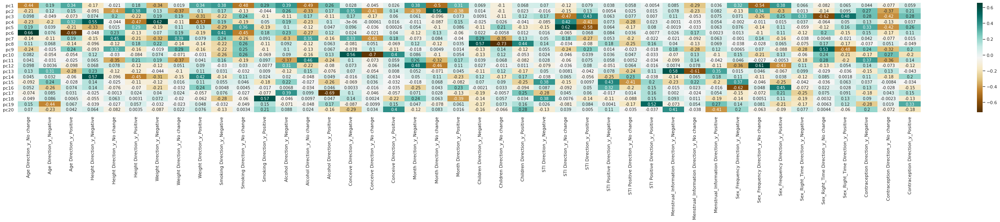

In [ ]:
result = pd.concat([principalDf, standard], axis=1)
result= result.corr()

result1 = result[[
                  'Gender',	'Step',	'Age',	'Height',	'Weight',	'Smoking New',	'Alcohol New',	'Trying_Conceive',	'Trying Month New',
            'Previous_Children',	'STI_Tested',	'STI_Positive',	'Menstrual_Information',	'Sex Frequency New',	
            'Contraception',	'Sex_Right_Time_Yes','Sex_Right_Time_No','Sex_Right_Time_Unsure',

            # 'Page Change',	'Steps',	'Duration (milliseconds)',	'Completion(%)',
            # 'Gender Change',	'Age Change',	'Height Change',	'Weight Change',	'Smoking Change',	'Alcohol Consumption Change',
            # 'Trying Conceive Change',	'Trying Months Change',	'Previous Children Change',	'STI Tested Change',
            # 'STI Positive Change',	'Menstrual Information Change',	'Sex Frequency Change',	'Sex Right Time Change',	
            # 'Contraception Change',	'AHW time spent',	'Smoking time spent',	'Alcohol time spent',	'Conceive time spent',
            # 'Month time spent', 'Children time spent', 'STI_Tested time spent', 'STI_Positive time spent',
            # 'Menstrual_Information time spent', 'Sex_Frequency time spent', 'Sex_Right_Time time spent', 'Contraception time spent',
            
            # 'Age Diff_x',	'Height Diff_x', 'Weight Diff_x', 'Smoking Diff_x','Alcohol Diff_x','Month Diff_x', 'Sex_Frequency Diff_x',
            # 'Age Diff_y',	'Height Diff_y', 'Weight Diff_y', 'Smoking Diff_y','Alcohol Diff_y','Month Diff_y', 'Sex_Frequency Diff_y',
            
            # 'Age Direction_x_No change','Age Direction_x_Negative','Age Direction_x_Positive',	'Height Direction_x_Negative',	
            # 'Height Direction_x_No change',	'Height Direction_x_Positive',	'Weight Direction_x_Negative',	
            # 'Weight Direction_x_No change',	'Weight Direction_x_Positive',	'Smoking Direction_x_Negative',	
            # 'Smoking Direction_x_No change',	'Smoking Direction_x_Positive',	'Alcohol Direction_x_Negative',	
            # 'Alcohol Direction_x_No change',	'Alcohol Direction_x_Positive',	'Conceive Direction_x_Negative',	
            # 'Conceive Direction_x_No change',	'Conceive Direction_x_Positive',	'Month Direction_x_Negative',
            # 'Month Direction_x_No change',	'Month Direction_x_Positive',	'Children Direction_x_Negative',	
            # 'Children Direction_x_No change',	'Children Direction_x_Positive',	'STI Direction_x_Negative',	
            # 'STI Direction_x_No change',	'STI Direction_x_Positive',	'STI Positive Direction_x_Negative',	
            # 'STI Positive Direction_x_No change',	'STI Positive Direction_x_Positive',	'Menstrual_Information Direction_x_Negative',
            # 'Menstrual_Information Direction_x_No change',	'Menstrual_Information Direction_x_Positive',	
            # 'Sex_Frequency Direction_x_Negative',	'Sex_Frequency Direction_x_No change',	'Sex_Frequency Direction_x_Positive',
            # 'Sex_Right_Time Direction_x_Negative',	'Sex_Right_Time Direction_x_No change',	'Sex_Right_Time Direction_x_Positive',
            # 'Contraception Direction_x_Negative',	'Contraception Direction_x_No change',	'Contraception Direction_x_Positive',
            
            # 'Age Direction_y_No change','Age Direction_y_Negative','Age Direction_y_Positive',	'Height Direction_y_Negative',	
            # 'Height Direction_y_No change',	'Height Direction_y_Positive',	'Weight Direction_y_Negative',	
            # 'Weight Direction_y_No change',	'Weight Direction_y_Positive',	'Smoking Direction_y_Negative',	
            # 'Smoking Direction_y_No change',	'Smoking Direction_y_Positive',	'Alcohol Direction_y_Negative',	
            # 'Alcohol Direction_y_No change',	'Alcohol Direction_y_Positive',	'Conceive Direction_y_Negative',	
            # 'Conceive Direction_y_No change',	'Conceive Direction_y_Positive',	'Month Direction_y_Negative',
            # 'Month Direction_y_No change',	'Month Direction_y_Positive',	'Children Direction_y_Negative',	
            # 'Children Direction_y_No change',	'Children Direction_y_Positive',	'STI Direction_y_Negative',	
            # 'STI Direction_y_No change',	'STI Direction_y_Positive',	'STI Positive Direction_y_Negative',	
            # 'STI Positive Direction_y_No change',	'STI Positive Direction_y_Positive',	'Menstrual_Information Direction_y_Negative',
            # 'Menstrual_Information Direction_y_No change',	'Menstrual_Information Direction_y_Positive',	
            # 'Sex_Frequency Direction_y_Negative',	'Sex_Frequency Direction_y_No change',	'Sex_Frequency Direction_y_Positive',
            # 'Sex_Right_Time Direction_y_Negative',	'Sex_Right_Time Direction_y_No change',	'Sex_Right_Time Direction_y_Positive',
            # 'Contraception Direction_y_Negative',	'Contraception Direction_y_No change',	'Contraception Direction_y_Positive',
            ]].loc[['pc1', 'pc2', 'pc3','pc4','pc5','pc6','pc7','pc8','pc9','pc10',
                    'pc11', 'pc12', 'pc13','pc14','pc15','pc16','pc17','pc18','pc19','pc20',
                    ]]
plt.figure(figsize=(50,5))
sns.heatmap(result1,cmap="BrBG",annot=True)

[]

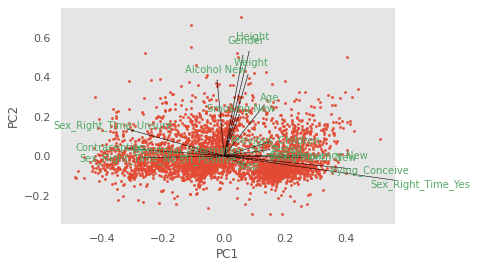

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley,s=5)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'black',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'green', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
    
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()



myplot(principalComponents[:,0:2],np.transpose(pca.components_[0:2, :]),list(standard.columns))
#plt.figure(figsize = (8,8))
plt.plot()

Text(0.5, 0, 'Principal Component 1')

Text(0, 0.5, 'Principal Component 2')

Text(0.5, 1.0, '2 component PCA')

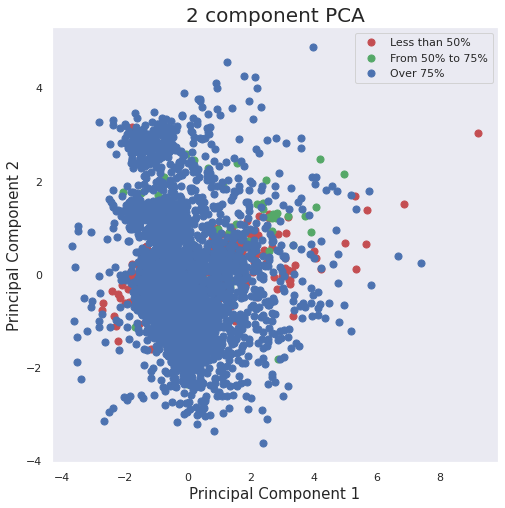

In [ ]:
# Separating out the target
y = dfProfileLast_DiffLastandSecond3.loc[:,['Completion(%)']].values

from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['pc1', 'pc2'])
finalDf = pd.concat([principalDf, dfProfileLast_DiffLastandSecond3[['Completion(%)']]], axis = 1)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = ['Less than 50%', 'From 50% to 75%', 'Over 75%']
colors = ['r', 'g', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Completion(%)'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'pc1']
               , finalDf.loc[indicesToKeep, 'pc2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()